# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
!python -m pip install "git+https://github.com/facebookresearch/detectron2.git"
#!git clone "https://github.com/facebookresearch/detectron2.git"
#!python -m pip install -e detectron2


In [2]:
#%cd detectron2
#%cd ..

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


c:\Users\Tobias\anaconda3\envs\rcnn\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_Mar__8_18:36:24_Pacific_Standard_Time_2022
Cuda compilation tools, release 11.6, V11.6.124
Build cuda_11.6.r11.6/compiler.31057947_0
torch:  1.11 ; cuda:  1.11.0
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from matplotlib import pyplot as plt
from PIL import Image

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [4]:
import os 

cwd = os.getcwd()
print(cwd)

c:\Ablage\Master\DeepVision\Studienarbeit\YOLOv5-vs-RCNN


In [5]:
DATASET_DIR = "datasets/visDrone_rcnn"
DATASET_NAME = "visDrone"
TRAIN = True

# Run a pre-trained detectron2 model

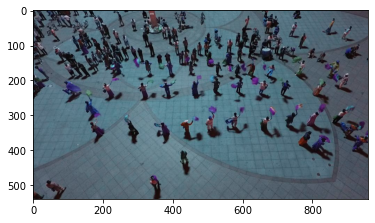

In [11]:
#show example image from the visDrone dataset
im = cv2.imread(f"{DATASET_DIR}/train/0000031_00000_d_0000037_jpg.rf.06fbd86be6ed3bfde8f499db349c8fab.jpg")
plt.imshow(im)
plt.show()

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [12]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml")
#cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

c:\Users\Tobias\anaconda3\envs\rcnn\lib\site-packages\torch\functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [13]:
# look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0, 32,  0,  0,  0,  0,  0, 33,  0,  0, 28,  0,  0,  0,  0,  0,
         0,  0,  0, 28,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 33, 35,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, 28,  0],
       device='cuda:0')
Boxes(tensor([[7.1021e+02, 2.0045e+02, 7.4009e+02, 2.4454e+02],
        [4.2252e+02, 3.0913e+02, 4.6388e+02, 3.7374e+02],
        [3.3242e+02, 4.7051e+02, 3.6850e+02, 5.4000e+02],
        [7.6110e+02, 3.4708e+02, 8.5744e+02, 4.2692e+02],
        [5.5064e+02, 2.9260e+02, 5.9545e+02, 3.4880e+02],
        [4.2048e+02, 4.0001e+02, 4.4531e+02, 4.4059e+02],
        [2.6158e+02, 2.9840e+02, 3.0363e+02, 3.7784e+02],
        [6.4918e+02, 2.8054e+02, 7.1203e+02, 3.6834e+02],
        [7.5133e+02, 1.4362e+02, 7.8215e+02, 1.8527e+02],
        [4.2989e+02, 7.6115e+01, 4.4575e+02, 1.2147e+02],
        [4.9472e+02, 3.0185e+02, 5.1770e+02, 3.4468e+02],
        [9.2824e+01

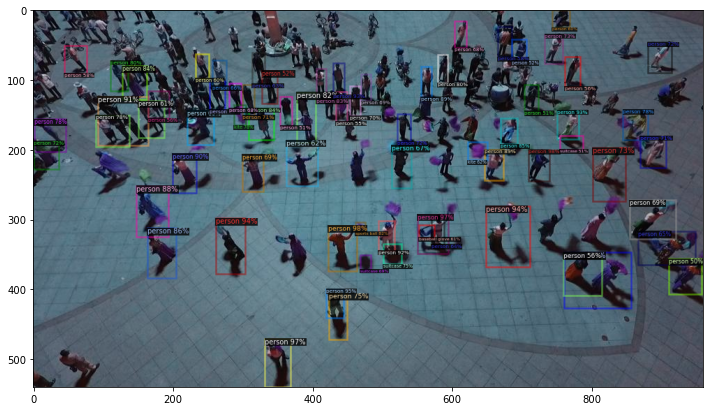

In [15]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2_imshow(out.get_image()[:, :, ::-1])
plt.imshow(out.get_image()[:, :, ::-1])
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

# Train on a VisDrone dataset


## Prepare the dataset

In [10]:
from detectron2.structures import BoxMode

from detectron2.data.datasets import register_coco_instances
register_coco_instances(f"{DATASET_NAME}_train", {}, f"{DATASET_DIR}/train/_annotation_train.json", f"{DATASET_DIR}/train")
register_coco_instances(f"{DATASET_NAME}_valid", {}, f"{DATASET_DIR}/valid/_annotation_valid.json", f"{DATASET_DIR}/valid")

In [11]:
from detectron2.data import get_detection_dataset_dicts
from detectron2.data.datasets import builtin_meta

In [12]:
dataset_dicts = get_detection_dataset_dicts([f"{DATASET_NAME}_train"])

[06/11 12:49:50 d2.data.datasets.coco]: Loading datasets/visDrone_rcnn/train/_annotation_train.json takes 1.08 seconds.
WARNING [06/11 12:49:50 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 12:49:50 d2.data.datasets.coco]: Loaded 5577 images in COCO format from datasets/visDrone_rcnn/train/_annotation_train.json
[06/11 12:49:50 d2.data.build]: Removed 0 images with no usable annotations. 5577 images left.
[06/11 12:49:50 d2.data.build]: Distribution of instances among all 11 categories:
|  category  | #instances   |  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:----------:|:-------------|:-------------:|:-------------|
|  Objects   | 0            | pedestrian | 2786         |    people     | 8882         |
|  bicycle   | 5884         |    car     | 121877       |      van      | 26343        |
|   truck    | 73184        |  tricycle  | 25501        | awning-tric.. | 413

In [14]:
_dataset_metadata = MetadataCatalog.get(f"{DATASET_NAME}_train")
_dataset_metadata.thing_colors = [cc['color'] for cc in builtin_meta.COCO_CATEGORIES]

In [15]:
_dataset_metadata

namespace(name='visDrone_train',
          json_file='datasets/visDrone_rcnn/train/_annotation_train.json',
          image_root='datasets/visDrone_rcnn/train',
          evaluator_type='coco',
          thing_classes=['Objects',
                         'pedestrian',
                         'people',
                         'bicycle',
                         'car',
                         'van',
                         'truck',
                         'tricycle',
                         'awning-tricycle',
                         'bus',
                         'motor'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
                                             7: 7,
      

In [16]:
NUM_CLASSES = len(_dataset_metadata.thing_classes)
print(f"{NUM_CLASSES}")

11


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



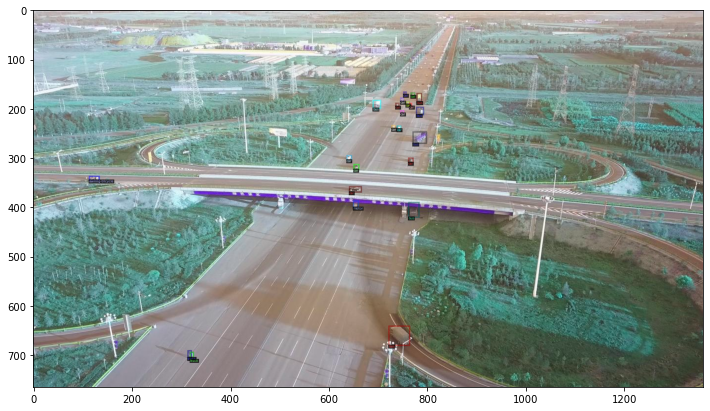

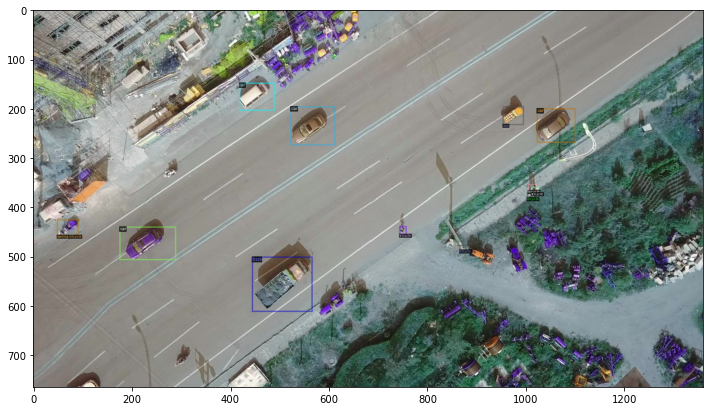

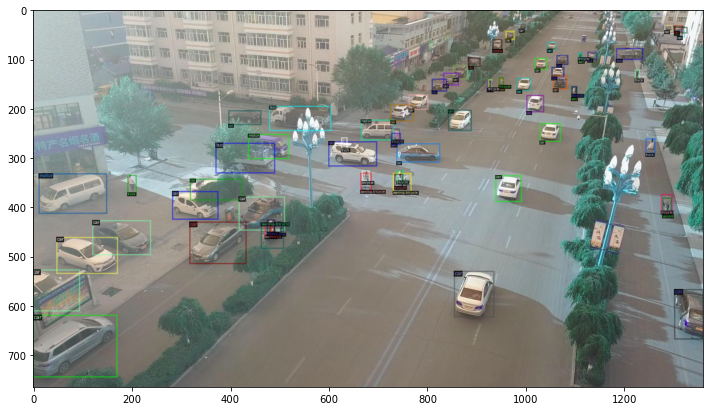

In [22]:
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1],metadata=_dataset_metadata, scale=1)
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [18]:
from detectron2.engine import DefaultTrainer

torch.cuda.empty_cache()

if TRAIN == True:
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
    cfg.DATASETS.TRAIN = (f"{DATASET_NAME}_train",)
    cfg.DATASETS.TEST = ()
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml")
    #cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
    cfg.SOLVER.IMS_PER_BATCH = 4  # "batch size"
    cfg.SOLVER.BASE_LR = 0.00025
    cfg.SOLVER.MAX_ITER = 2000   
    cfg.SOLVER.STEPS = []        # do not decay learning rate
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # (default: 512)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES  

    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    trainer = DefaultTrainer(cfg) 
    trainer.resume_or_load(resume=False)
    trainer.train()

[06/11 02:10:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (12, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (44, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (44,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias

[06/11 02:10:41 d2.engine.train_loop]: Starting training from iteration 0
[06/11 02:11:32 d2.utils.events]:  eta: 0:52:14  iter: 19  total_loss: 3.439  loss_cls: 2.457  loss_box_reg: 0.6198  loss_rpn_cls: 0.1886  loss_rpn_loc: 0.1458  time: 1.9100  data_time: 0.1077  lr: 4.9953e-06  max_mem: 7562M
[06/11 02:12:01 d2.utils.events]:  eta: 0:48:02  iter: 39  total_loss: 3.359  loss_cls: 2.364  loss_box_reg: 0.6431  loss_rpn_cls: 0.1575  loss_rpn_loc: 0.1647  time: 1.6766  data_time: 0.0027  lr: 9.9902e-06  max_mem: 7562M
[06/11 02:12:30 d2.utils.events]:  eta: 0:47:03  iter: 59  total_loss: 3.139  loss_cls: 2.174  loss_box_reg: 0.6612  loss_rpn_cls: 0.1327  loss_rpn_loc: 0.1878  time: 1.5883  data_time: 0.0025  lr: 1.4985e-05  max_mem: 7562M
[06/11 02:12:58 d2.utils.events]:  eta: 0:46:33  iter: 79  total_loss: 2.73  loss_cls: 1.807  loss_box_reg: 0.6052  loss_rpn_cls: 0.161  loss_rpn_loc: 0.1815  time: 1.5473  data_time: 0.0026  lr: 1.998e-05  max_mem: 7562M
[06/11 02:13:27 d2.utils.even

In [1]:
# Look at training curves in tensorboard:
%load_ext tensorboard
#%tensorboard --logdir ./output
#%tensorboard dev upload --logdir ./output
#%tensorboard --logdir=rcnn:./output,yolov5:yolov5/runs/train

Reusing TensorBoard on port 6006 (pid 2544), started 7 days, 15:37:32 ago. (Use '!kill 2544' to kill it.)

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the visDrone validation dataset. First, let's create a predictor using the model we just trained:



In [19]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "rcnn_visDrone_2000_r_101_c4_3x/model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES  
predictor = DefaultPredictor(cfg)

[06/11 12:51:04 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                         | Shapes                                          |
|:------------------------------------------------|:--------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}     | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weig

In [20]:
dataset_dicts_val = get_detection_dataset_dicts([f"{DATASET_NAME}_valid"])
#dataset_dicts_val = dataset_dicts

WARNING [06/11 12:51:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 12:51:07 d2.data.datasets.coco]: Loaded 700 images in COCO format from datasets/visDrone_rcnn/valid/_annotation_valid.json
[06/11 12:51:07 d2.data.build]: Removed 0 images with no usable annotations. 700 images left.
[06/11 12:51:07 d2.data.build]: Distribution of instances among all 11 categories:
|  category  | #instances   |  category  | #instances   |   category    | #instances   |
|:----------:|:-------------|:----------:|:-------------|:-------------:|:-------------|
|  Objects   | 0            | pedestrian | 437          |    people     | 1044         |
|  bicycle   | 797          |    car     | 15655        |      van      | 3566         |
|   truck    | 9219         |  tricycle  | 3453         | awning-tric.. | 657          |
|    bus     | 1354         |   motor    | 2678         |               |              |
|   total    | 38860 

Then, we randomly select several samples to visualize the prediction results.

datasets/visDrone_rcnn/valid\0000276_01401_d_0000514_jpg.rf.deccac664fbcade5eac7506c645657ad.jpg


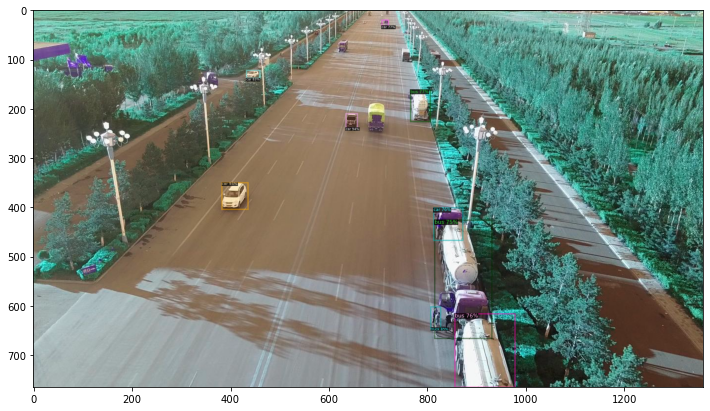

datasets/visDrone_rcnn/valid\0000279_05201_d_0000607_jpg.rf.0fc91c1ed36c73db8104d15b737e8385.jpg


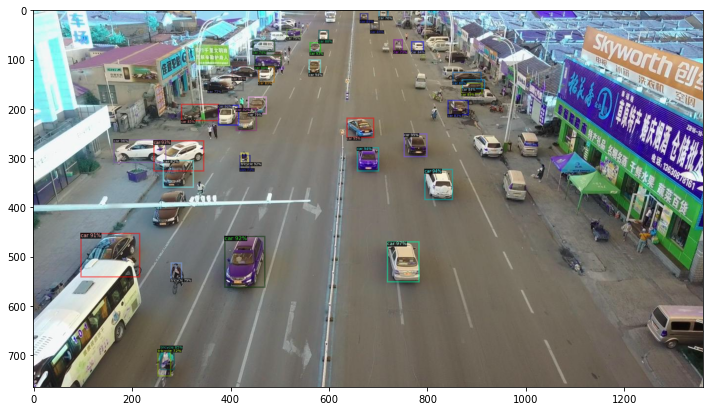

datasets/visDrone_rcnn/valid\9999998_00294_d_0000247_jpg.rf.7bfd44693af14882d60599bc9dcd79b0.jpg


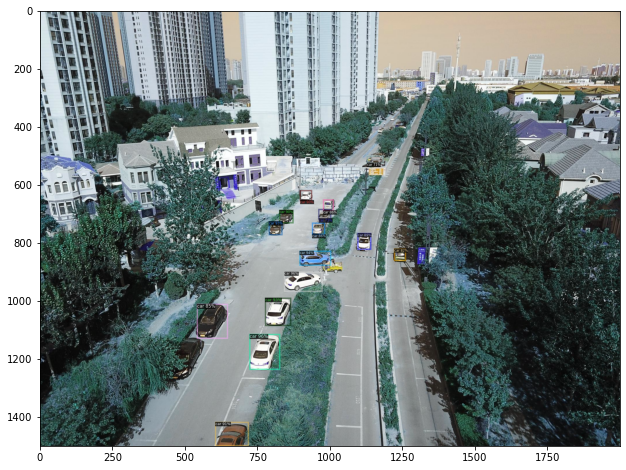

In [23]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts_val = dataset_dicts_val

for d in random.sample(dataset_dicts_val, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=_dataset_metadata, 
                   scale=1, 
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(d["file_name"])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

We can also evaluate its performance using AP metric implemented in COCO API

In [24]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator(f"{DATASET_NAME}_valid", output_dir="./output")
val_loader = build_detection_test_loader(cfg, f"{DATASET_NAME}_valid")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [06/11 20:58:21 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[06/11 20:58:21 d2.data.datasets.coco]: Loaded 700 images in COCO format from datasets/visDrone_rcnn/valid/_annotation_valid.json
[06/11 20:58:21 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/11 20:58:21 d2.data.common]: Serializing 700 elements to byte tensors and concatenating them all ...
[06/11 20:58:22 d2.data.common]: Serialized dataset takes 1.34 MiB
[06/11 20:58:22 d2.evaluation.evaluator]: Start inference on 700 batches
[06/11 20:58:30 d2.evaluation.evaluator]: Inference done 11/700. Dataloading: 0.0003 s/iter. Inference: 0.3517 s/iter. Eval: 0.0002 s/iter. Total: 0.3522 s/iter. ETA=0:04:02
[06/11 20:58:36 d2.evaluation.evaluator]: Inference done 25/700. Dataloading: 0.0006 s/iter. Inference: 0.3657 s/iter. Eval: 0.0002 s/

visDrone_results_3000_r_50_c4_1

In [ ]:
#OrderedDict([('bbox', {'AP': 3.194053453469353, 'AP50': 5.81221411233713, 'AP75': 3.1585363343377337, 'APs': 2.3248673576653243, 'APm': 11.318792167301801, 
# 'APl': 28.9491984912777, 'AP-pedestrian': 2.0960183003597117, 'AP-people': 0.36509900990099015, 'AP-bicycle': 0.0, 'AP-car': 19.719057646348016, 
# 'AP-van': 2.4124422107707293, 'AP-truck': 1.3920103142155011, 'AP-tricycle': 0.0, 'AP-awning-tricycle': 0.0, 'AP-bus': 5.626546062700904, 'AP-motor': 0.3293609903976823})])

#Average Precition

visDrone_results_2000_R_101_FPN_3x

In [ ]:
# OrderedDict([('bbox', {'AP': 3.194053453469353, 'AP50': 5.81221411233713, 'AP75': 3.1585363343377337, 'APs': 2.3248673576653243, 'APm': 11.318792167301801, 'APl': 28.9491984912777, 
# 'AP-pedestrian': 2.0960183003597117, 'AP-people': 0.36509900990099015, 'AP-bicycle': 0.0, 'AP-car': 19.719057646348016, 'AP-van': 2.4124422107707293, 'AP-truck': 1.3920103142155011, 
# 'AP-tricycle': 0.0, 'AP-awning-tricycle': 0.0, 'AP-bus': 5.626546062700904, 'AP-motor': 0.3293609903976823})])

rcnn_visDrone_2000_r_101_c4_3x

In [ ]:
#OrderedDict([('bbox', {'AP': 4.947990696290761, 'AP50': 8.286787556649362, 'AP75': 5.270401951709144, 'APs': 1.3756033200567328, 'APm': 7.9915576449350505, 'APl': 15.725575640939486, 
# 'AP-Objects': nan, 'AP-pedestrian': 0.0, 'AP-people': 0.0, 'AP-bicycle': 10.208695333633731, 'AP-car': 27.152318953625, 'AP-van': 0.8377356297625359, 'AP-truck': 5.13179229416146, 
# 'AP-tricycle': 1.1639416621502703, 'AP-awning-tricycle': 0.0, 'AP-bus': 2.556528351932039, 'AP-motor': 2.4288947376425734})])

# Run segmentation on a video